# Coffee Shop Sales Analysis

The project follows a structured data analysis workflow focused on analyzing coffee shop sales data

### Importing the libraries

In [43]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

##  Data Loading and Initial Exploration

In [44]:
df = pd.read_csv('Coffee Shop Sales.csv')
df.head()

,transaction_id,transaction_date,transaction_time,transaction_qty,store_id,store_location,product_id,unit_price,product_category,product_type,product_detail
0,1,1/1/2023,7:06:11,2,5,Lower Manhattan,32,3.0,Coffee,Gourmet brewed coffee,Ethiopia Rg
1,2,1/1/2023,7:08:56,2,5,Lower Manhattan,57,3.1,Tea,Brewed Chai tea,Spicy Eye Opener Chai Lg
2,3,1/1/2023,7:14:04,2,5,Lower Manhattan,59,4.5,Drinking Chocolate,Hot chocolate,Dark chocolate Lg
3,4,1/1/2023,7:20:24,1,5,Lower Manhattan,22,2.0,Coffee,Drip coffee,Our Old Time Diner Blend Sm
4,5,1/1/2023,7:22:41,2,5,Lower Manhattan,57,3.1,Tea,Brewed Chai tea,Spicy Eye Opener Chai Lg


In [45]:
df.tail()

,transaction_id,transaction_date,transaction_time,transaction_qty,store_id,store_location,product_id,unit_price,product_category,product_type,product_detail
149111,149452,6/30/2023,20:18:41,2,8,Hell's Kitchen,44,2.50,Tea,Brewed herbal tea,Peppermint Rg
149112,149453,6/30/2023,20:25:10,2,8,Hell's Kitchen,49,3.00,Tea,Brewed Black tea,English Breakfast Lg
149113,149454,6/30/2023,20:31:34,1,8,Hell's Kitchen,45,3.00,Tea,Brewed herbal tea,Peppermint Lg
149114,149455,6/30/2023,20:57:19,1,8,Hell's Kitchen,40,3.75,Coffee,Barista Espresso,Cappuccino
149115,149456,6/30/2023,20:57:19,2,8,Hell's Kitchen,64,0.80,Flavours,Regular syrup,Hazelnut syrup


In [46]:
df.shape

(149116, 11)

In [47]:
df.dtypes

transaction_id        int64
transaction_date     object
transaction_time     object
transaction_qty       int64
store_id              int64
store_location       object
product_id            int64
unit_price          float64
product_category     object
product_type         object
product_detail       object
dtype: object

# Step 1: Data Cleaning & Preparation

### 1. Merge transaction_date and transaction_time into transaction_datetime


In [48]:
# Load data (assuming it's in a DataFrame named 'df')
df['transaction_datetime'] = pd.to_datetime(
    df['transaction_date'] + ' ' + df['transaction_time'],
    format='%m/%d/%Y %H:%M:%S'
)

# Drop original columns (optional)
df.drop(['transaction_date', 'transaction_time'], axis=1, inplace=True)

### 2. Create New Fields

In [49]:
# Total revenue
df['total_revenue'] = df['transaction_qty'] * df['unit_price']

# Extract day, month, hour, etc.
df['day_of_week'] = df['transaction_datetime'].dt.day_name()  # e.g., "Monday"
df['month'] = df['transaction_datetime'].dt.month_name()     # e.g., "January"
df['hour'] = df['transaction_datetime'].dt.hour             # e.g., 7 (for 7 AM)

### 3. Standardize Categorical Columns

In [50]:
# Standardize text (trim whitespace, capitalize first letters)
text_cols = ['product_category', 'product_type', 'product_detail', 'store_location']
df[text_cols] = df[text_cols].apply(lambda x: x.str.strip().str.title())

df.head()

,transaction_id,transaction_qty,store_id,store_location,product_id,unit_price,product_category,product_type,product_detail,transaction_datetime,total_revenue,day_of_week,month,hour
0,1,2,5,Lower Manhattan,32,3.0,Coffee,Gourmet Brewed Coffee,Ethiopia Rg,2023-01-01 07:06:11,6.0,Sunday,January,7
1,2,2,5,Lower Manhattan,57,3.1,Tea,Brewed Chai Tea,Spicy Eye Opener Chai Lg,2023-01-01 07:08:56,6.2,Sunday,January,7
2,3,2,5,Lower Manhattan,59,4.5,Drinking Chocolate,Hot Chocolate,Dark Chocolate Lg,2023-01-01 07:14:04,9.0,Sunday,January,7
3,4,1,5,Lower Manhattan,22,2.0,Coffee,Drip Coffee,Our Old Time Diner Blend Sm,2023-01-01 07:20:24,2.0,Sunday,January,7
4,5,2,5,Lower Manhattan,57,3.1,Tea,Brewed Chai Tea,Spicy Eye Opener Chai Lg,2023-01-01 07:22:41,6.2,Sunday,January,7


### 4. Validate Changes

In [51]:
# Check if missing values are resolved
print("Missing Values After Cleaning:\n", df.isnull().sum())

# Verify consistency in categorical columns
print("Unique Product Categories:\n", df['product_category'].unique())

Missing Values After Cleaning:
 transaction_id          0
transaction_qty         0
store_id                0
store_location          0
product_id              0
unit_price              0
product_category        0
product_type            0
product_detail          0
transaction_datetime    0
total_revenue           0
day_of_week             0
month                   0
hour                    0
dtype: int64
Unique Product Categories:
 ['Coffee' 'Tea' 'Drinking Chocolate' 'Bakery' 'Flavours' 'Loose Tea'
 'Coffee Beans' 'Packaged Chocolate' 'Branded']


# Step 2: Exploratory Data Analysis (EDA)

## A. Sales Trends

### 1. Daily Revenue Trends


C:\Users\srini\AppData\Local\Temp\ipykernel_19344\4282582175.py:10: UserWarning:

This axis already has a converter set and is updating to a potentially incompatible converter



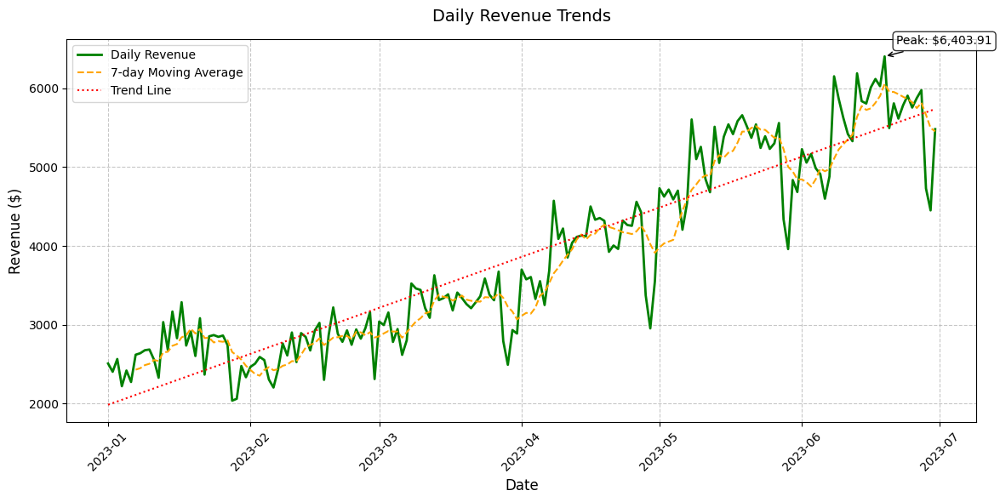

In [52]:
# Daily Revenue
daily_revenue = df.groupby(df['transaction_datetime'].dt.date)['total_revenue'].sum()
plt.figure(figsize=(12, 6))
daily_revenue.plot(color='green', linewidth=2, label='Daily Revenue')
moving_avg = daily_revenue.rolling(window=7).mean()
moving_avg.plot(color='orange', linestyle='--', label='7-day Moving Average')
x = np.arange(len(daily_revenue))
z = np.polyfit(x, daily_revenue.values, 1)
p = np.poly1d(z)
plt.plot(daily_revenue.index, p(x), color='red', linestyle=':', label='Trend Line')
plt.title('Daily Revenue Trends', fontsize=14, pad=15)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Revenue ($)', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend()
plt.xticks(rotation=45)

# Add annotation for max revenue
max_revenue = daily_revenue.max()
max_date = daily_revenue.idxmax()
plt.annotate(f'Peak: ${max_revenue:,.2f}', 
            xy=(max_date, max_revenue),
            xytext=(10, 10),
            textcoords='offset points',
            arrowprops=dict(arrowstyle='->'),
            bbox=dict(boxstyle='round,pad=0.3', fc='white', alpha=0.8))
plt.tight_layout()
plt.show()

### 2. Monthly Revenue Trends


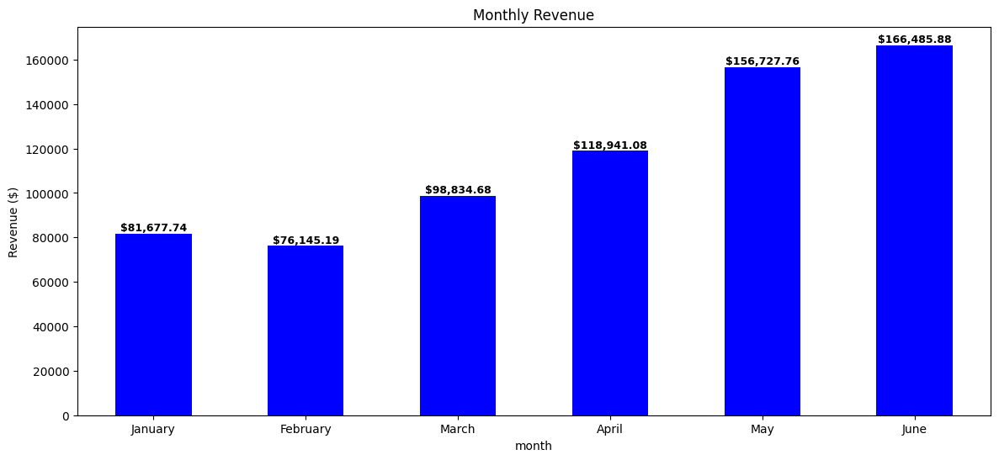

In [53]:
# Monthly Revenue
monthly_revenue = df.groupby('month')['total_revenue'].sum().sort_values()
fig, ax = plt.subplots(figsize=(14, 6))
month_order = ['January', 'February', 'March', 'April', 'May', 'June']
monthly_revenue = monthly_revenue.reindex(month_order)
monthly_revenue.plot(kind='bar', title='Monthly Revenue', color='blue')
for i, revenue in enumerate(monthly_revenue):
    ax.text(i, revenue, f'${revenue:,.2f}', 
            ha='center', va='bottom', fontsize=9, fontweight='bold')
plt.ylabel('Revenue ($)')
plt.xticks(rotation=0)
plt.show()

### 3. Weekday vs. Weekend Sales

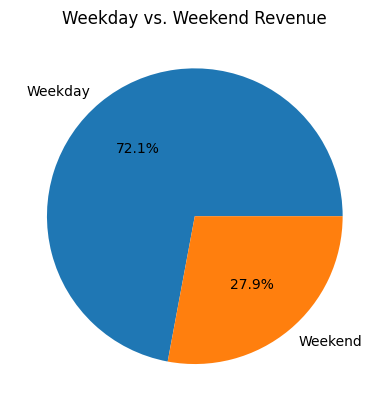

In [54]:
df['is_weekend'] = df['day_of_week'].isin(['Saturday', 'Sunday'])
weekday_vs_weekend = df.groupby('is_weekend')['total_revenue'].sum()
weekday_vs_weekend.plot(kind='pie', autopct='%1.1f%%', title='Weekday vs. Weekend Revenue',labels=['Weekday', 'Weekend'])
plt.ylabel('')
plt.show()

# B. Product Insights

### 1. Top 10 Best-Selling Products by Quantity


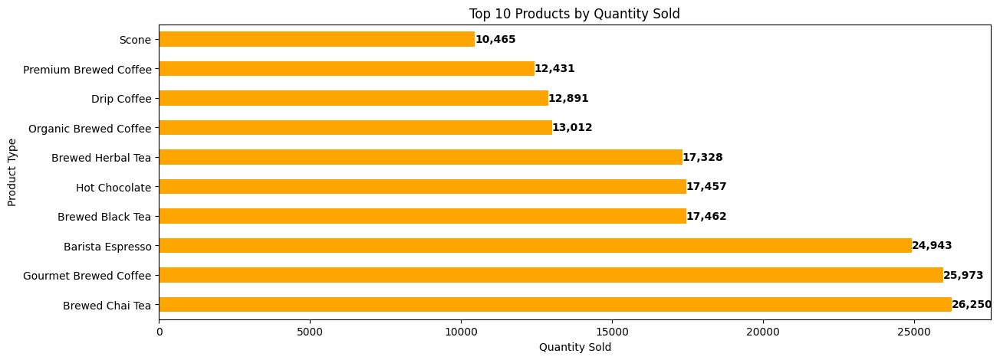

In [55]:
top10_quantity = df.groupby('product_type')['transaction_qty'].sum().nlargest(10)
fig, ax = plt.subplots(figsize=(14, 5))
bars = top10_quantity.plot(kind='barh', title='Top 10 Products by Quantity Sold', color='orange')
plt.xlabel('Quantity Sold')
plt.ylabel('Product Type')

for bar in bars.patches:
    width = bar.get_width()
    y = bar.get_y() + bar.get_height() / 2
    ax.text(width, y, f'{width:,.0f}', ha='left', va='center', fontsize=10, fontweight='bold')

plt.show()

### 2. Top 10 Best-Selling Products by Revenue

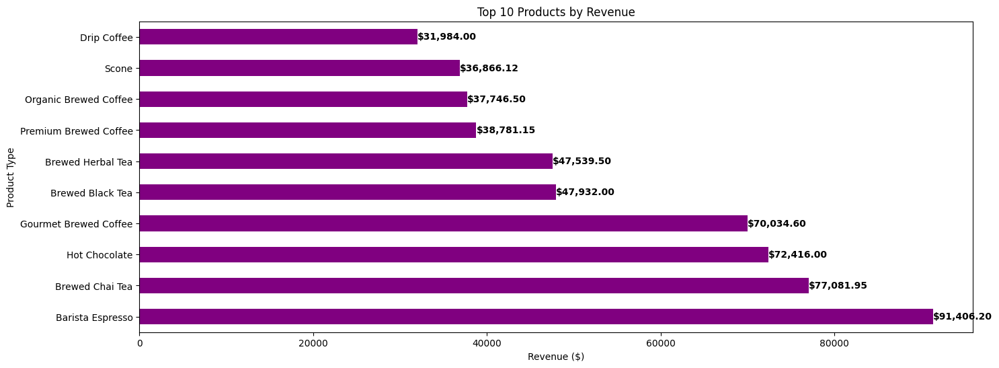

In [56]:
# By Revenue
top10_revenue = df.groupby('product_type')['total_revenue'].sum().nlargest(10)
fig, ax = plt.subplots(figsize=(16, 6))
bars = top10_revenue.plot(kind='barh', title='Top 10 Products by Revenue', color='purple')
plt.xlabel('Revenue ($)')
plt.ylabel('Product Type')

for bar in bars.patches:
    width = bar.get_width()
    y = bar.get_y() + bar.get_height() / 2
    ax.text(width, y, f'${width:,.2f}', ha='left', va='center', fontsize=10, fontweight='bold')

plt.show()


### 3. Performance by Category

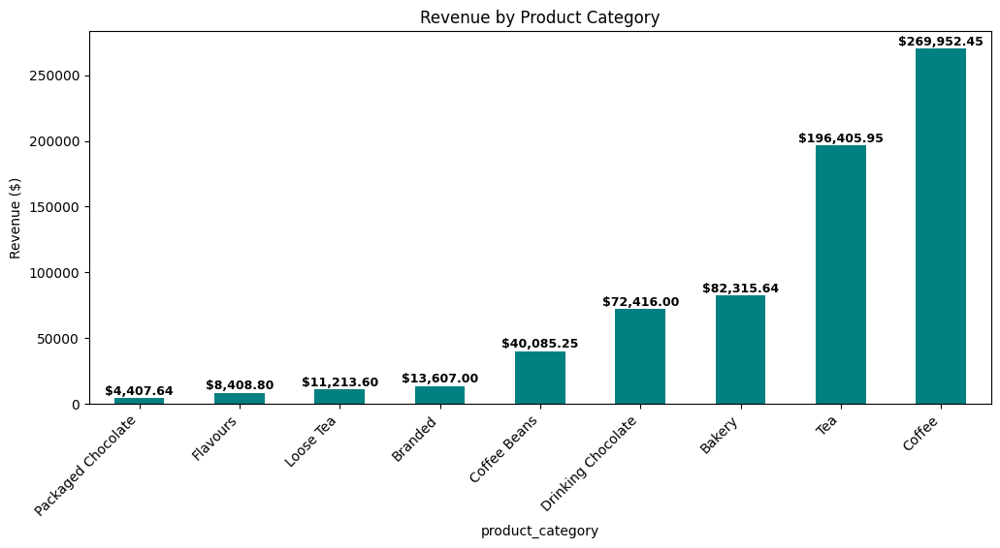

In [57]:
# Revenue by Category
category_revenue = df.groupby('product_category')['total_revenue'].sum().sort_values()
fig, ax = plt.subplots(figsize=(12, 5))
ax = category_revenue.plot(kind='bar', title='Revenue by Product Category', color='teal')
plt.ylabel('Revenue ($)')
plt.xticks(rotation=45, ha='right') # Rotate x-axis labels for better readability

for p in ax.patches:
    ax.annotate(f'${p.get_height():,.2f}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 5), textcoords='offset points', fontsize=9, fontweight='bold')

plt.show()

### 4. Price Distribution by Category

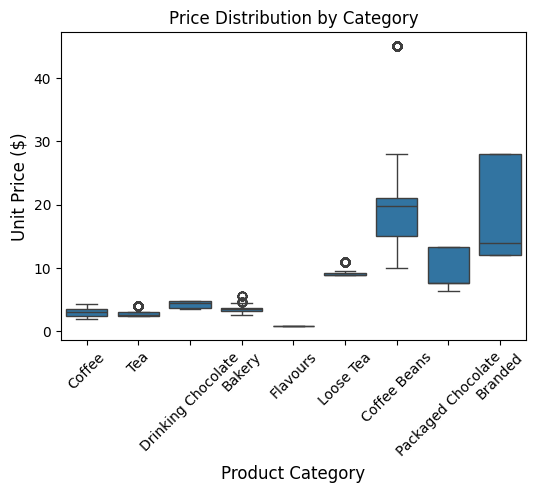

In [58]:
import seaborn as sns
plt.figure(figsize=(6, 4))
sns.boxplot(data=df, x='product_category', y='unit_price')
plt.title('Price Distribution by Category')
plt.xlabel('Product Category', fontsize=12)
plt.ylabel('Unit Price ($)', fontsize=12)
plt.xticks(rotation=45)
plt.show()

# C. Store Performance

### 1. Revenue by Store Location

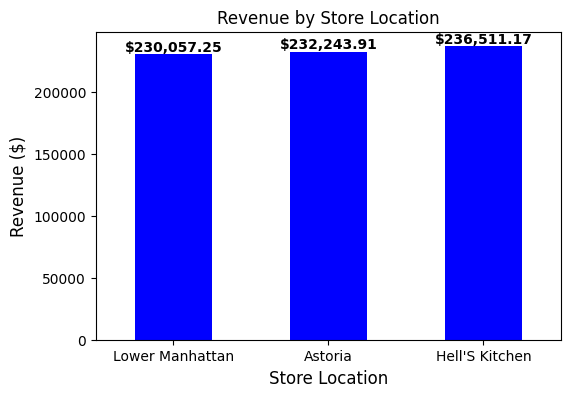

In [59]:
# By Location
store_location_revenue = df.groupby('store_location')['total_revenue'].sum().sort_values()
fig, ax = plt.subplots(figsize=(6, 4))
store_location_revenue.plot(kind='bar', title='Revenue by Store Location', color='blue')
for i, revenue in enumerate(store_location_revenue):
    ax.text(i, revenue, f'${revenue:,.2f}', 
            ha='center', va='bottom', fontsize=10, fontweight='bold')

plt.xlabel('Store Location', fontsize=12)
plt.ylabel('Revenue ($)', fontsize=12)
plt.xticks(rotation=0)
plt.show()

### 2. Store-Specific Peak Hours

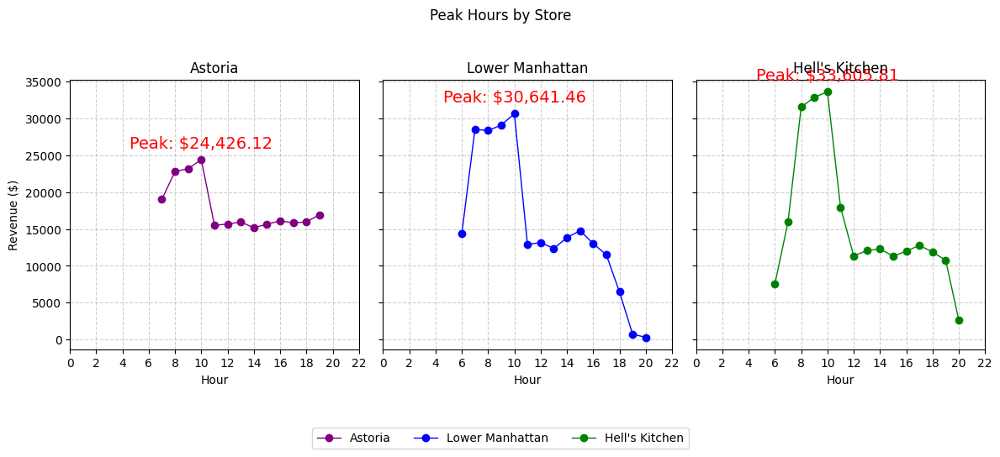

In [60]:
# Define store IDs and names
store_mapping = {
    3: 'Astoria',
    5: 'Lower Manhattan',
    8: "Hell's Kitchen"
}

# Create figure and subplots
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(12, 5), sharey=True)
colors = ['purple', 'blue', 'green']

# Plot hourly revenue for each store and annotate peak
for idx, (store_id, store_name) in enumerate(store_mapping.items()):
    store_data = df[df['store_id'] == store_id]
    store_hourly = store_data.groupby('hour')['total_revenue'].sum()
    axes[idx].plot(store_hourly.index, store_hourly.values, label=store_name, color=colors[idx],
                   linewidth=1, marker='o')
    axes[idx].set_title(store_name)
    axes[idx].set_xlabel('Hour')
    axes[idx].grid(True, linestyle='--', alpha=0.6)
    axes[idx].set_xticks(range(0, 24, 2))

    peak_revenue = store_hourly.max()
    peak_hour = store_hourly.idxmax()
    axes[idx].annotate(f'Peak: ${peak_revenue:,.2f}',
                        xy=(peak_hour, peak_revenue),
                        xytext=(0, 10), textcoords='offset points',
                        ha='center', fontsize=14, color='red')

# Set common y-axis label
axes[0].set_ylabel('Revenue ($)')

# Add a figure-level legend
fig.legend(loc='upper center', bbox_to_anchor=(0.5,-0.005),  ncol=3)
fig.suptitle('Peak Hours by Store')
plt.tight_layout(rect=[0, 0.05, 1, 0.95])# Adjust layout to make space for suptitle and legend
plt.show()

### 3. Average Transaction Size Per Store

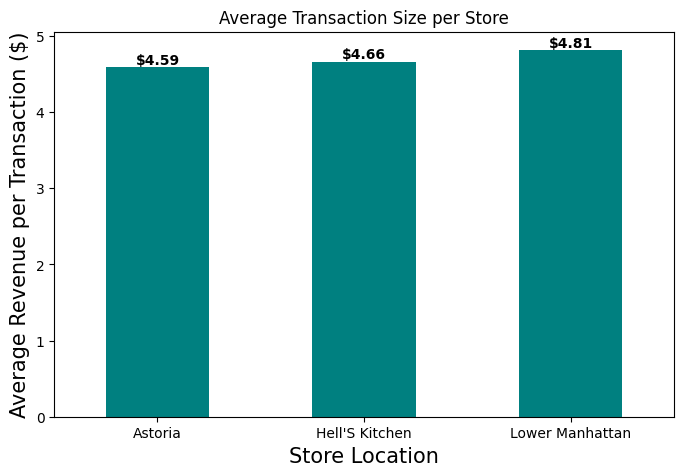

In [61]:
# Calculate average transaction size per store
avg_transaction = df.groupby('store_location')['total_revenue'].mean()
fig, ax = plt.subplots(figsize=(8, 5))
avg_transaction.plot(kind='bar', ax=ax, title='Average Transaction Size per Store', color='teal')

# Add value labels on top of each bar
for i, revenue in enumerate(avg_transaction):
    ax.text(i, revenue, f'${revenue:,.2f}', 
            ha='center', va='bottom', fontsize=10, fontweight='bold')

plt.xlabel('Store Location', fontsize=15)
plt.ylabel('Average Revenue per Transaction ($)', fontsize=15)
plt.xticks(rotation=0)
plt.show()

# D. Customer Behavior (Implicit)

### 1. Purchase Frequency by Hour

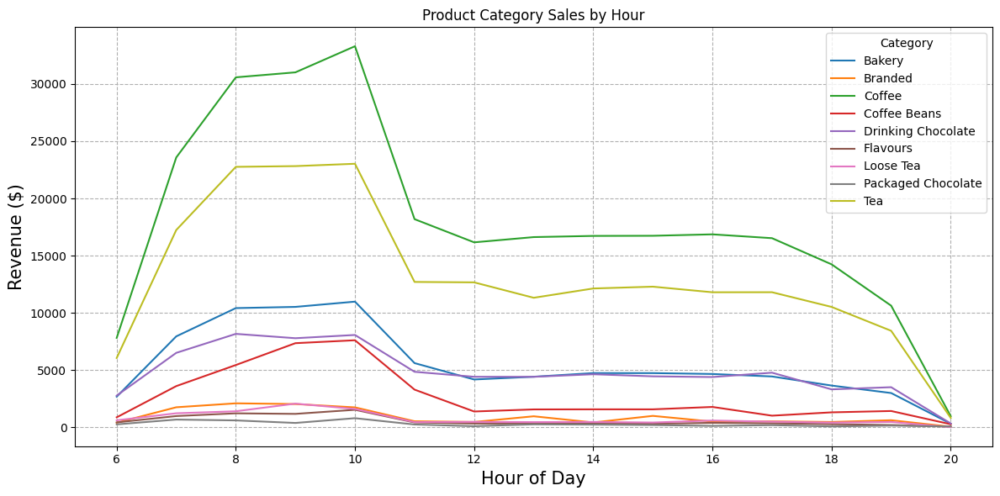

In [62]:
time_category_sales = df.pivot_table(
    index='hour',
    columns='product_category',
    values='total_revenue',
    aggfunc='sum'
)
fig, ax = plt.subplots(figsize=(12, 6))  # You already had this, and it's good for figure size!
time_category_sales.plot(kind='line', title='Product Category Sales by Hour', ax=ax) # Pass the ax to the plot
plt.ylabel('Revenue ($)', fontsize=15)
plt.xlabel('Hour of Day', fontsize=15)

plt.grid(True, linestyle='--', alpha=1)
plt.legend(title='Category', loc='upper right') # Added legend title and location.
plt.tight_layout()
plt.show()

# Step 3: Feature Engineering for Modeling

Preparing the dataset for predictive modeling by extracting time-based, product-level, and store-level features.

### 1. Time-Based Features

Extracting granular time components to capture trends:

* Cyclical encoding helps models understand that hour=23 and hour=0 are adjacent.



In [63]:
# Extract time components
df['hour'] = df['transaction_datetime'].dt.hour
df['day_of_week'] = df['transaction_datetime'].dt.dayofweek  # Monday=0, Sunday=6
df['month'] = df['transaction_datetime'].dt.month
df['is_weekend'] = df['day_of_week'].isin([5, 6]).astype(int)  # Binary flag

# Cyclical encoding for hour/day (to preserve continuity)
df['hour_sin'] = np.sin(2 * np.pi * df['hour'] / 24)
df['hour_cos'] = np.cos(2 * np.pi * df['hour'] / 24)
df['day_sin'] = np.sin(2 * np.pi * df['day_of_week'] / 7)
df['day_cos'] = np.cos(2 * np.pi * df['day_of_week'] / 7)

### 2. Product-Level Features

Encoding categorical features and deriving metrics:

* is_premium helps segment high/low-price products.

In [64]:
# One-hot encode product categories/types
product_dummies = pd.get_dummies(
    df[['product_category', 'product_type']], 
    prefix=['cat', 'type'], 
    drop_first=True
)
df = pd.concat([df, product_dummies], axis=1)

# Price-based features
df['price_per_unit'] = df['unit_price'] / df['transaction_qty']  # Normalized price
df['is_premium'] = (df['unit_price'] > df['unit_price'].median()).astype(int)  # Binary flag

### 3. Store-Level Features

Encoding locations and aggregating store performance:

* store_avg_revenue captures store performance as a feature.

In [65]:
# One-hot encode store location
store_dummies = pd.get_dummies(
    df['store_location'], 
    prefix='store', 
    drop_first=True
)
df = pd.concat([df, store_dummies], axis=1)

# Store-level aggregations (e.g., avg revenue per store)
store_metrics = df.groupby('store_id').agg({
    'total_revenue': ['mean', 'sum'],
    'transaction_qty': 'sum'
}).reset_index()
store_metrics.columns = ['store_id', 'store_avg_revenue', 'store_total_revenue', 'store_total_qty']

# Merge back into main DataFrame
df = df.merge(store_metrics, on='store_id', how='left')

### 4. Lag Features

For time-series forecasting

In [66]:
# Sort by datetime
df = df.sort_values('transaction_datetime')

# Revenue from previous 3 days (for forecasting)
df['revenue_lag_3'] = df.groupby('store_id')['total_revenue'].shift(3)
df.shape

(149116, 63)

# Step 4 :  Feature Engineering for Modeling

In [67]:
# Select a subset of key engineered features to preview
feature_preview = df[[
    'transaction_datetime', 'hour', 'day_of_week', 'month', 'is_weekend',
    'product_category', 'product_type', 'unit_price', 'is_premium',
    'store_location', 'store_avg_revenue', 'revenue_lag_3'
]].sample(5, random_state=42)  # Random sample of 5 rows

feature_preview.head()

,transaction_datetime,hour,day_of_week,month,is_weekend,product_category,product_type,unit_price,is_premium,store_location,store_avg_revenue,revenue_lag_3
116605,2023-06-03 14:04:38,14,5,6,1,Coffee,Barista Espresso,3.75,1,Lower Manhattan,4.814726,9.0
119258,2023-06-05 17:41:39,17,0,6,0,Tea,Brewed Chai Tea,4.00,1,Lower Manhattan,4.814726,5.0
105265,2023-05-23 16:56:17,16,1,5,0,Coffee,Gourmet Brewed Coffee,3.00,0,Lower Manhattan,4.814726,10.5
29487,2023-02-21 15:40:56,15,1,2,0,Bakery,Scone,3.25,1,Lower Manhattan,4.814726,7.5
126885,2023-06-12 09:23:04,9,0,6,0,Coffee,Premium Brewed Coffee,3.75,1,Hell'S Kitchen,4.661696,5.0


# 1. Sales Forecasting with Random Forest

### Description :

* Preprocesses daily sales data to ensure quality and consistency

* Extracts time-based features (e.g., day of week, month) to enhance temporal understanding

* Trains a Random Forest model on historical revenue patterns

* Evaluates model performance using:

   * Mean Absolute Error (MAE)

   * R² Score (Coefficient of Determination)

* Identifies key drivers of sales using feature importance analysis

* Visualizes predicted vs actual revenue for performance comparison and interpretation

Mean Absolute Error: $203.23
R² Score: 0.9373

Feature Importance:
               Feature  Importance
4               Coffee    0.529948
2               Bakery    0.336964
10                 Tea    0.082154
5         Coffee Beans    0.014947
7             Flavours    0.008383
3              Branded    0.008097
6   Drinking Chocolate    0.006718
15             month_4    0.003268
9   Packaged Chocolate    0.002966
8            Loose Tea    0.002434
17             month_6    0.001299
16             month_5    0.001025
14             month_3    0.000452
1    store_avg_revenue    0.000412
0           is_weekend    0.000351
11          store_id_5    0.000321
13             month_2    0.000198
12          store_id_8    0.000064


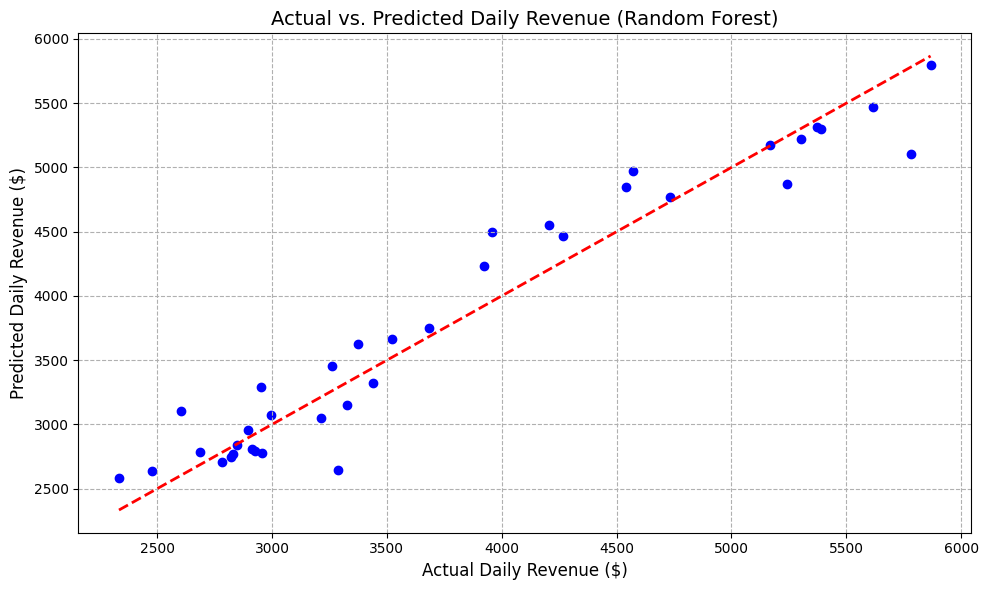

In [68]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, r2_score 

# Extract date from transaction_datetime
df['date'] = df['transaction_datetime'].dt.date

# Aggregate product category revenues by date
product_pivot = df.pivot_table(
    index='date',
    columns='product_category',
    values='total_revenue',
    aggfunc='sum',
    fill_value=0
).reset_index()

# Aggregate other features to daily level
daily_data = df.groupby('date').agg({
    'total_revenue': 'sum',
    'store_id': 'first',  # Use first store_id (assumes daily data is store-specific)
    'is_weekend': 'first',
    'store_avg_revenue': 'first',
    'month': 'first'
}).reset_index()

# Merge product category revenues with daily data
daily_data = daily_data.merge(product_pivot, on='date', how='left')

# One-hot encode categorical features
daily_data = pd.get_dummies(daily_data, columns=['store_id', 'month'], drop_first=True)

# Define features (X) and target (y)
X = daily_data.drop(['date', 'transaction_datetime', 'total_revenue'], axis=1, errors='ignore')
y = daily_data['total_revenue']

# Split data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train Random Forest Regressor
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Predict on test set
y_pred = model.predict(X_test)

# Evaluate model
mae = mean_absolute_error(y_test, y_pred)
print(f'Mean Absolute Error: ${mae:,.2f}')

r2 = r2_score(y_test, y_pred)
print(f'R² Score: {r2:.4f}')

# Feature importance
feature_importance = pd.DataFrame({
    'Feature': X.columns,
    'Importance': model.feature_importances_
}).sort_values('Importance', ascending=False)
print("\nFeature Importance:")
print(feature_importance)

# Plot actual vs. predicted revenue
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, color='blue', alpha=1)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
plt.xlabel('Actual Daily Revenue ($)', fontsize=12)
plt.ylabel('Predicted Daily Revenue ($)', fontsize=12)
plt.title('Actual vs. Predicted Daily Revenue (Random Forest)', fontsize=14)
plt.grid(True, linestyle='--', alpha=1)
plt.tight_layout()
plt.show()

# 2. Time Series Forecasting with Prophet

* Using Facebook's Prophet model for time series forecasting
* Creating forecasts for each store location
* Predicting future sales trends
* The model uses multiplicative seasonality with daily and weekly seasonality components

23:49:04 - cmdstanpy - INFO - Chain [1] start processing
23:49:05 - cmdstanpy - INFO - Chain [1] done processing


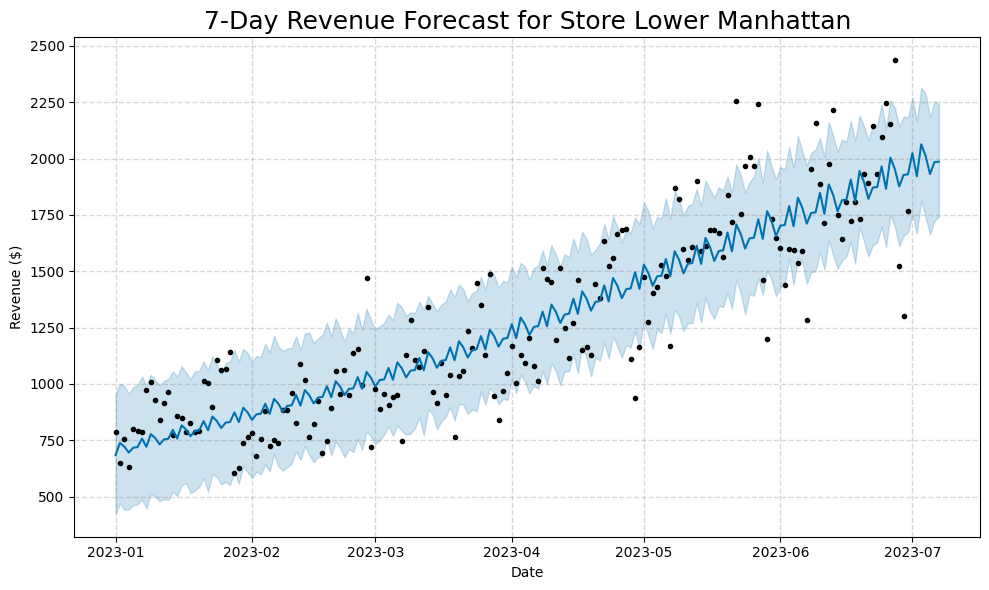

23:49:05 - cmdstanpy - INFO - Chain [1] start processing
23:49:05 - cmdstanpy - INFO - Chain [1] done processing


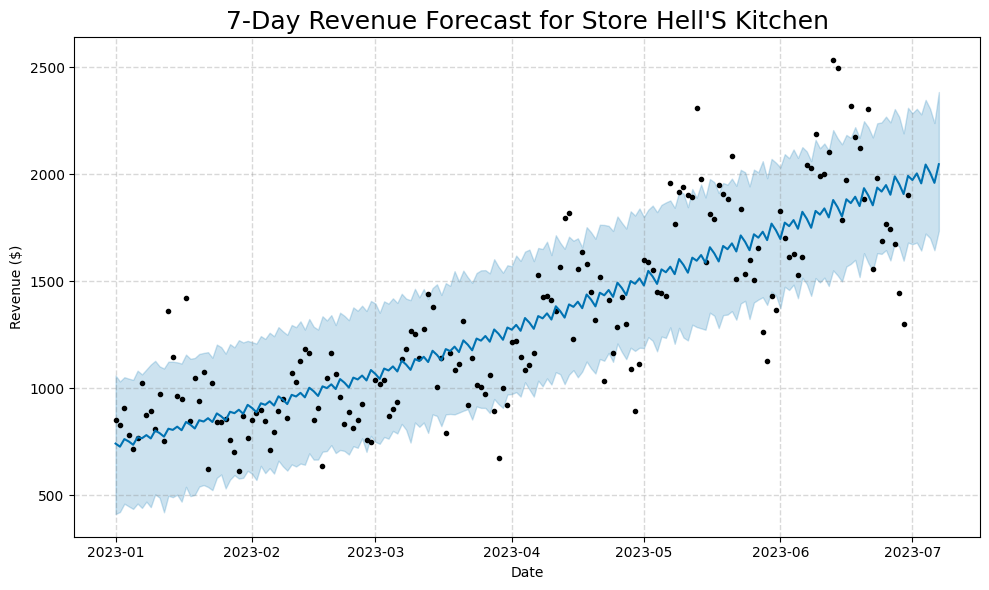

23:49:05 - cmdstanpy - INFO - Chain [1] start processing
23:49:05 - cmdstanpy - INFO - Chain [1] done processing


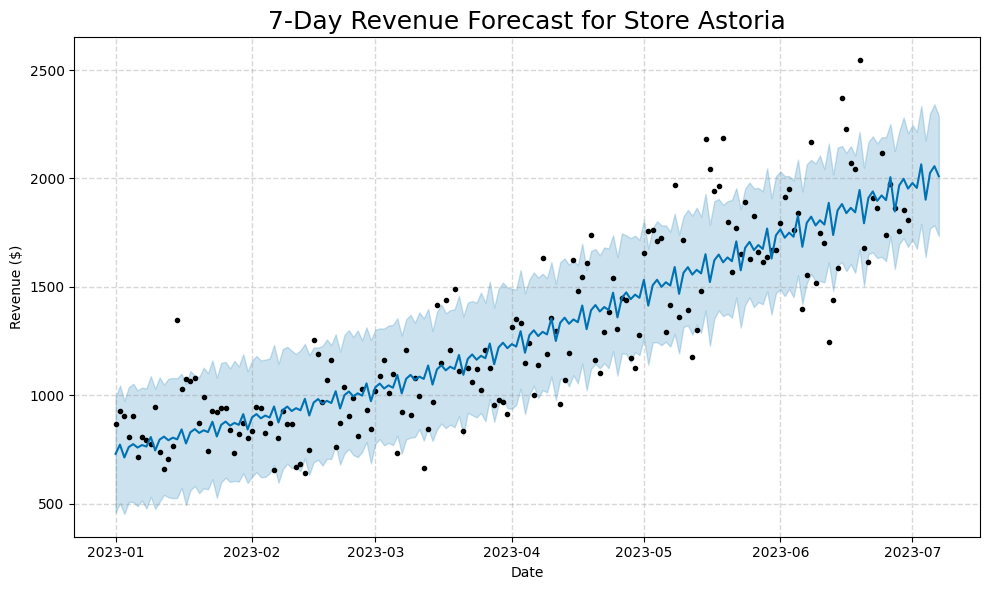

In [69]:
from prophet import Prophet

for store_id in df['store_location'].unique():
    store_data = df[df['store_location'] == store_id]
    ts_data = store_data.groupby(store_data['transaction_datetime'].dt.date)['total_revenue'].sum().reset_index()
    ts_data.columns = ['ds', 'y']
    ts_data['ds'] = pd.to_datetime(ts_data['ds'])
    
    # Fill missing dates
    date_range = pd.date_range(start=ts_data['ds'].min(), end=ts_data['ds'].max(), freq='D')
    ts_data = ts_data.set_index('ds').reindex(date_range, fill_value=0).reset_index()
    ts_data.columns = ['ds', 'y']
    
    # Fit model
    model = Prophet(seasonality_mode='multiplicative', daily_seasonality=True, weekly_seasonality=True)
    model.fit(ts_data)
    
    # Forecast
    future = model.make_future_dataframe(periods=7)
    forecast = model.predict(future)
    
    # Plot
    fig = model.plot(forecast, xlabel='Date', ylabel='Revenue ($)')
    plt.title(f'7-Day Revenue Forecast for Store {store_id}', fontsize=18)
    plt.grid(True, linestyle='--', alpha=0.3)
    plt.tight_layout()
    plt.show()

##  Store Segmentation using K-Means Clustering

###  Data Aggregation
Aggregates store-level metrics such as:
- **Average revenue per store**
- **Total revenue**
- **Total transaction quantity**
- **Ratio of weekend sales**

###  Feature Scaling
Uses `StandardScaler` to normalize data for effective clustering.

### K-Means Clustering
- Applies **K-Means** with `k=2` to segment stores into two distinct groups.
- Suitable since the dataset includes three store locations (ensures meaningful groupings).

###  Cluster Assignment
Each store is labeled with a **cluster ID** (`0,1,2`).

###  Cluster Summary Output
Displays cluster membership with relevant store statistics for interpretation.


In [70]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import os

# Aggregate store-level metrics
store_features = df.groupby('store_location').agg({
    'total_revenue': ['mean', 'sum'],
    'transaction_qty': 'sum',
    'is_weekend': 'mean'
}).reset_index()
store_features.columns = ['store_location', 'avg_revenue', 'total_revenue', 'total_qty', 'weekend_sales_ratio']

# Scale features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(store_features[['avg_revenue', 'total_revenue', 'total_qty', 'weekend_sales_ratio']])

# Fit K-Means with k=2 (valid for 3 stores)
kmeans = KMeans(n_clusters=2, random_state=42)
store_features['cluster'] = kmeans.fit_predict(X_scaled)

# Summarize clusters
print("\nCluster Summary:")
print(store_features[['cluster', 'store_location', 'avg_revenue', 'total_revenue', 'total_qty']].round(2))



Cluster Summary:
   cluster   store_location  avg_revenue  total_revenue  total_qty
0        0          Astoria         4.59      232243.91      70991
1        0   Hell'S Kitchen         4.66      236511.17      71737
2        1  Lower Manhattan         4.81      230057.25      71742


In [71]:
df.head()

,transaction_id,transaction_qty,store_id,store_location,product_id,unit_price,product_category,product_type,product_detail,transaction_datetime,...,type_Sugar Free Syrup,price_per_unit,is_premium,store_Hell'S Kitchen,store_Lower Manhattan,store_avg_revenue,store_total_revenue,store_total_qty,revenue_lag_3,date
0,1,2,5,Lower Manhattan,32,3.0,Coffee,Gourmet Brewed Coffee,Ethiopia Rg,2023-01-01 07:06:11,...,False,1.50,0,False,True,4.814726,230057.25,71742,NaN,2023-01-01
1,2,2,5,Lower Manhattan,57,3.1,Tea,Brewed Chai Tea,Spicy Eye Opener Chai Lg,2023-01-01 07:08:56,...,False,1.55,1,False,True,4.814726,230057.25,71742,NaN,2023-01-01
2,3,2,5,Lower Manhattan,59,4.5,Drinking Chocolate,Hot Chocolate,Dark Chocolate Lg,2023-01-01 07:14:04,...,False,2.25,1,False,True,4.814726,230057.25,71742,NaN,2023-01-01
3,4,1,5,Lower Manhattan,22,2.0,Coffee,Drip Coffee,Our Old Time Diner Blend Sm,2023-01-01 07:20:24,...,False,2.00,0,False,True,4.814726,230057.25,71742,6.0,2023-01-01
4,5,2,5,Lower Manhattan,57,3.1,Tea,Brewed Chai Tea,Spicy Eye Opener Chai Lg,2023-01-01 07:22:41,...,False,1.55,1,False,True,4.814726,230057.25,71742,6.2,2023-01-01


# Step 5: Data Visualization with Plotly

Creating interactive, professional charts for deeper insights.



# 1. Line Plot: Daily Revenue Over Time

Features:

* Hover tooltip shows exact date/revenue.

* Zoomable/Panable timeline.

In [72]:
import plotly.express as px

# Aggregate daily revenue
daily_revenue = df.groupby(df['transaction_datetime'].dt.date)['total_revenue'].sum().reset_index()

fig = px.line(
    daily_revenue, 
    x='transaction_datetime', 
    y='total_revenue',
    title='<b>Daily Revenue Trends</b>',
    labels={'transaction_datetime': 'Date', 'total_revenue': 'Revenue ($)'},
    template='plotly_white'
)
fig.update_traces(line_color='#2b8cbe', line_width=2)
fig.update_layout(hovermode='x unified')
fig.show()

# 2. Bar Chart: Revenue by Product Category

Features:

* Color-coded by category.

* Click to toggle categories on/off.

In [73]:
category_revenue = df.groupby('product_category')['total_revenue'].sum().reset_index()

fig = px.bar(
    category_revenue, 
    x='product_category', 
    y='total_revenue',
    title='<b>Revenue by Product Category</b>',
    color='product_category',
    color_discrete_sequence=px.colors.qualitative.Pastel,
    labels={'total_revenue': 'Revenue ($)'}
)
fig.update_layout(xaxis_title=None, showlegend=False)
fig.show()

# 3. Heatmap: Transactions by Hour & Weekday


Features:

* Darker shades = peak hours (e.g., 8 AM on weekdays).

In [74]:
# Prepare data
heatmap_data = df.pivot_table(
    index='hour', 
    columns='day_of_week', 
    values='transaction_id', 
    aggfunc='count',
    fill_value=0
)

fig = px.imshow(
    heatmap_data,
    title='<b>Transaction Heatmap: Hour vs. Weekday</b>',
    labels={'x': 'Day of Week', 'y': 'Hour', 'color': 'Transactions'},
    color_continuous_scale='Blues'
)
fig.update_layout(
    xaxis=dict(tickvals=[0,1,2,3,4,5,6], ticktext=['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])
)
fig.show()

# 4. Pie Chart: Category-Wise Revenue Share

Features:

* Interactive legend (click to highlight).

In [75]:
fig = px.pie(
    category_revenue,
    names='product_category',
    values='total_revenue',
    title='<b>Revenue Share by Category</b>',
    hole=0.3,
    color_discrete_sequence=px.colors.qualitative.Set3
)
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

# 5. Boxplot: Price Distribution by Product Type

Features:

* Hover to see product details.

* Compare outliers (e.g., premium vs. regular).

In [76]:
fig = px.box(
    df, 
    x='product_type', 
    y='unit_price',
    title='<b>Unit Price Distribution by Product Type</b>',
    color='product_category',
    points='all',
    hover_data=['product_detail']
)
fig.update_layout(
    xaxis_title=None,
    yaxis_title='Price ($)',
    boxmode='group'
)
fig.show()

In [77]:
df.head()

,transaction_id,transaction_qty,store_id,store_location,product_id,unit_price,product_category,product_type,product_detail,transaction_datetime,...,type_Sugar Free Syrup,price_per_unit,is_premium,store_Hell'S Kitchen,store_Lower Manhattan,store_avg_revenue,store_total_revenue,store_total_qty,revenue_lag_3,date
0,1,2,5,Lower Manhattan,32,3.0,Coffee,Gourmet Brewed Coffee,Ethiopia Rg,2023-01-01 07:06:11,...,False,1.50,0,False,True,4.814726,230057.25,71742,NaN,2023-01-01
1,2,2,5,Lower Manhattan,57,3.1,Tea,Brewed Chai Tea,Spicy Eye Opener Chai Lg,2023-01-01 07:08:56,...,False,1.55,1,False,True,4.814726,230057.25,71742,NaN,2023-01-01
2,3,2,5,Lower Manhattan,59,4.5,Drinking Chocolate,Hot Chocolate,Dark Chocolate Lg,2023-01-01 07:14:04,...,False,2.25,1,False,True,4.814726,230057.25,71742,NaN,2023-01-01
3,4,1,5,Lower Manhattan,22,2.0,Coffee,Drip Coffee,Our Old Time Diner Blend Sm,2023-01-01 07:20:24,...,False,2.00,0,False,True,4.814726,230057.25,71742,6.0,2023-01-01
4,5,2,5,Lower Manhattan,57,3.1,Tea,Brewed Chai Tea,Spicy Eye Opener Chai Lg,2023-01-01 07:22:41,...,False,1.55,1,False,True,4.814726,230057.25,71742,6.2,2023-01-01


# Interactive Dashboard Setup

Combing all charts in a Dash/Plotly Dashboard:

Features:

* Dropdown to filter by store.

* All charts update dynamically.

In [78]:
from jupyter_dash import JupyterDash
from dash import Dash, dcc, html, Input, Output, dash_table
import dash_bootstrap_components as dbc
import pandas as pd
import numpy as np
import plotly.express as px
from datetime import datetime

required_columns = ['transaction_id', 'transaction_qty', 'store_location', 'product_category', 'product_type', 'total_revenue', 'transaction_datetime']
missing_columns = [col for col in required_columns if col not in df.columns]
if missing_columns:
    raise ValueError(f"Missing required columns: {missing_columns}")
    
# Convert and map columns
df['date'] = pd.to_datetime(df['transaction_datetime'], errors='coerce')
if df['date'].isna().any():
    raise ValueError("Invalid or missing dates in 'transaction_datetime' column")
df['revenue'] = df['total_revenue']
df['month'] = df['date'].dt.strftime('%B')

# Calculate total_revenue
df['total_revenue'] = df['transaction_qty'] * df['unit_price']

# Color scheme for coffee shop theme
COLOR_SCHEME = {
    'background': '#F5E9D4',  # Creamy latte beige
    'text': '#3C2F2F',       # Dark coffee brown
    'primary': '#8B5A2B',    # Warm mocha brown
    'secondary': '#A68A64',  # Muted taupe
    'success': '#4A7043',    # Deep coffee plant green
    'card_header': '#2B1E14', # Dark espresso brown
    'chart_colors': px.colors.qualitative.Antique  # Earthy, coffee-inspired palette
}

# Initialize the JupyterDash app with Bootstrap and Font Awesome
app = JupyterDash(__name__, external_stylesheets=[
    dbc.themes.BOOTSTRAP,
    "https://use.fontawesome.com/releases/v5.15.4/css/all.css"
])

# Define dropdown options with validation
category_options = [{'label': cat, 'value': cat} for cat in sorted(df['product_category'].dropna().unique())]
location_options = [{'label': loc, 'value': loc} for loc in sorted(df['store_location'].dropna().unique())]

# Define the layout
app.layout = dbc.Container([
    # Title Row
    dbc.Row([
        dbc.Col(html.H1("☕ Coffee Shop Sales Dashboard",
                        className="text-center my-4",
                        style={
                            'color': COLOR_SCHEME['card_header'],
                            'fontWeight': 'bold',
                            'textShadow': '1px 1px 2px rgba(0,0,0,0.1)'
                        }),
                width=12)
    ], className="mb-4"),

    # Filters Row
    dbc.Row([
        dbc.Col([
            html.Label("Product Category",
                       className="filter-label",
                       style={'fontWeight': '500', 'marginBottom': '5px'}),
            dcc.Dropdown(
                id='category-filter',
                options=category_options,
                multi=True,
                placeholder="All Categories",
                style={'borderRadius': '8px', 'border': '1px solid #ced4da'}
            )
        ], md=4),

        dbc.Col([
            html.Label("Store Location",
                       className="filter-label",
                       style={'fontWeight': '500', 'marginBottom': '5px'}),
            dcc.Dropdown(
                id='location-filter',
                options=location_options,
                multi=True,
                placeholder="All Locations",
                style={'borderRadius': '8px', 'border': '1px solid #ced4da'}
            )
        ], md=4),

        dbc.Col([
            html.Label("Time Period",
                       className="filter-label",
                       style={'fontWeight': '500', 'marginBottom': '5px'}),
            dcc.Dropdown(
                id='time-filter',
                options=[
                    {'label': 'Last 7 Days', 'value': '7d'},
                    {'label': 'Last 30 Days', 'value': '30d'},
                    {'label': 'Last Quarter', 'value': '90d'},
                    {'label': 'Last 6 Months', 'value': '180d'},
                    {'label': 'All Time', 'value': 'all'}
                ],
                value='30d',
                clearable=False,
                style={'borderRadius': '8px', 'border': '1px solid #ced4da'}
            )
        ], md=4)
    ], className="mb-4 g-3"),

    # KPI Cards Row
    dbc.Row([
        dbc.Col(dbc.Card([
            dbc.CardBody([
                html.Div(className="card-icon", style={
                    'background': f'rgba({int(COLOR_SCHEME["primary"][1:3], 16)}, {int(COLOR_SCHEME["primary"][3:5], 16)}, {int(COLOR_SCHEME["primary"][5:7], 16)}, 0.1)',
                    'width': '50px',
                    'height': '50px',
                    'borderRadius': '50%',
                    'display': 'flex',
                    'alignItems': 'center',
                    'justifyContent': 'center',
                    'marginBottom': '15px'
                }, children=[
                    html.I(className="fas fa-dollar-sign", style={'color': COLOR_SCHEME['primary']})
                ]),
                html.H5("Total Sales", className="card-title", style={
                    'color': COLOR_SCHEME['secondary'],
                    'fontSize': '0.9rem',
                    'marginBottom': '5px'
                }),
                html.H4(id='total-sales-kpi', className="card-value", style={
                    'color': COLOR_SCHEME['card_header'],
                    'fontWeight': '600'
                })
            ])
        ], className="shadow-sm border-0", style={
            'borderLeft': f'4px solid {COLOR_SCHEME["primary"]}',
            'borderRadius': '8px'
        }), md=3),

        dbc.Col(dbc.Card([
            dbc.CardBody([
                html.Div(className="card-icon", style={
                    'background': f'rgba({int(COLOR_SCHEME["success"][1:3], 16)}, {int(COLOR_SCHEME["success"][3:5], 16)}, {int(COLOR_SCHEME["success"][5:7], 16)}, 0.1)',
                    'width': '50px',
                    'height': '50px',
                    'borderRadius': '50%',
                    'display': 'flex',
                    'alignItems': 'center',
                    'justifyContent': 'center',
                    'marginBottom': '15px'
                }, children=[
                    html.I(className="fas fa-shopping-cart", style={'color': COLOR_SCHEME['success']})
                ]),
                html.H5("Total Orders", className="card-title", style={
                    'color': COLOR_SCHEME['secondary'],
                    'fontSize': '0.9rem',
                    'marginBottom': '5px'
                }),
                html.H4(id='total-orders-kpi', className="card-value", style={
                    'color': COLOR_SCHEME['card_header'],
                    'fontWeight': '600'
                })
            ])
        ], className="shadow-sm border-0", style={
            'borderLeft': f'4px solid {COLOR_SCHEME["success"]}',
            'borderRadius': '8px'
        }), md=3),

        dbc.Col(dbc.Card([
            dbc.CardBody([
                html.Div(className="card-icon", style={
                    'background': f'rgba({int(COLOR_SCHEME["secondary"][1:3], 16)}, {int(COLOR_SCHEME["secondary"][3:5], 16)}, {int(COLOR_SCHEME["secondary"][5:7], 16)}, 0.1)',
                    'width': '50px',
                    'height': '50px',
                    'borderRadius': '50%',
                    'display': 'flex',
                    'alignItems': 'center',
                    'justifyContent': 'center',
                    'marginBottom': '15px'
                }, children=[
                    html.I(className="fas fa-calculator", style={'color': COLOR_SCHEME['secondary']})
                ]),
                html.H5("Avg. Order Value", className="card-title", style={
                    'color': COLOR_SCHEME['secondary'],
                    'fontSize': '0.9rem',
                    'marginBottom': '5px'
                }),
                html.H4(id='avg-order-kpi', className="card-value", style={
                    'color': COLOR_SCHEME['card_header'],
                    'fontWeight': '600'
                })
            ])
        ], className="shadow-sm border-0", style={
            'borderLeft': f'4px solid {COLOR_SCHEME["secondary"]}',
            'borderRadius': '8px'
        }), md=3),

        dbc.Col(dbc.Card([
            dbc.CardBody([
                html.Div(className="card-icon", style={
                    'background': f'rgba({int(COLOR_SCHEME["success"][1:3], 16)}, {int(COLOR_SCHEME["success"][3:5], 16)}, {int(COLOR_SCHEME["success"][5:7], 16)}, 0.1)',
                    'width': '50px',
                    'height': '50px',
                    'borderRadius': '50%',
                    'display': 'flex',
                    'alignItems': 'center',
                    'justifyContent': 'center',
                    'marginBottom': '15px'
                }, children=[
                    html.I(className="fas fa-star", style={'color': COLOR_SCHEME['success']})
                ]),
                html.H5("Top Category", className="card-title", style={
                    'color': COLOR_SCHEME['secondary'],
                    'fontSize': '0.9rem',
                    'marginBottom': '5px'
                }),
                html.H4(id='top-category-kpi', className="card-value", style={
                    'color': COLOR_SCHEME['card_header'],
                    'fontWeight': '600'
                })
            ])
        ], className="shadow-sm border-0", style={
            'borderLeft': f'4px solid {COLOR_SCHEME["success"]}',
            'borderRadius': '8px'
        }), md=3)
    ], className="mb-4 g-3"),

    # Charts Row 1
    dbc.Row([
        dbc.Col(dcc.Graph(id='sales-by-category-chart'), md=6),
        dbc.Col(dcc.Graph(id='sales-by-location-chart'), md=6)
    ], className="mb-4 g-3"),

    # Charts Row 2
    dbc.Row([
        dbc.Col(dcc.Graph(id='product-type-chart'), md=6),
        dbc.Col(dcc.Graph(id='monthly-trend-chart'), md=6)
    ], className="mb-4 g-3"),

    # Data Table Row
    dbc.Row([
        dbc.Col([
            html.H5("Transaction Details", className="mb-3", style={
                'color': COLOR_SCHEME['card_header'],
                'fontWeight': '600',
                'paddingBottom': '5px',
                'borderBottom': f'2px solid {COLOR_SCHEME["primary"]}'
            }),
            dash_table.DataTable(
                id='transaction-table',
                columns=[
                    {"name": "ID", "id": "transaction_id"},
                    {"name": "Date", "id": "date"},
                    {"name": "Category", "id": "product_category"},
                    {"name": "Product", "id": "product_type"},
                    {"name": "Location", "id": "store_location"},
                    {"name": "Qty", "id": "transaction_qty"},
                    {"name": "Revenue", "id": "revenue"}
                ],
                page_size=10,
                style_table={
                    'overflowX': 'auto',
                    'borderRadius': '8px',
                    'boxShadow': '0 4px 6px rgba(0,0,0,0.05)',
                    'border': '1px solid #e9ecef'
                },
                style_cell={
                    'textAlign': 'left',
                    'padding': '12px',
                    'fontFamily': 'Arial, sans-serif',
                    'border': '1px solid #e9ecef',
                    'minWidth': '80px', 'width': '120px', 'maxWidth': '180px',
                },
                style_header={
                    'backgroundColor': COLOR_SCHEME['card_header'],
                    'color': 'white',
                    'fontWeight': 'bold',
                    'textTransform': 'uppercase',
                    'fontSize': '12px'
                },
                style_data={
                    'fontSize': '13px',
                    'color': COLOR_SCHEME['text']
                },
                style_data_conditional=[
                    {
                        'if': {'row_index': 'odd'},
                        'backgroundColor': f'rgba({int(COLOR_SCHEME["primary"][1:3], 16)}, {int(COLOR_SCHEME["primary"][3:5], 16)}, {int(COLOR_SCHEME["primary"][5:7], 16)}, 0.03)'
                    },
                    {
                        'if': {'column_id': 'revenue'},
                        'fontWeight': '600',
                        'color': COLOR_SCHEME['primary']
                    }
                ]
            )
        ], width=12)
    ])
], fluid=True, style={'backgroundColor': COLOR_SCHEME['background']})

# Callbacks
@app.callback(
    [Output('total-sales-kpi', 'children'),
     Output('total-orders-kpi', 'children'),
     Output('avg-order-kpi', 'children'),
     Output('top-category-kpi', 'children')],
    [Input('category-filter', 'value'),
     Input('location-filter', 'value'),
     Input('time-filter', 'value')]
)
def update_kpis(selected_categories, selected_locations, time_period):
    filtered_df = df.copy()

    if selected_categories:
        filtered_df = filtered_df[filtered_df['product_category'].isin(selected_categories)]
    if selected_locations:
        filtered_df = filtered_df[filtered_df['store_location'].isin(selected_locations)]
    if time_period != 'all':
        days = int(time_period[:-1])
        cutoff_date = df['date'].max() - pd.Timedelta(days=days)
        filtered_df = filtered_df[filtered_df['date'] >= cutoff_date]

    total_sales = f"${filtered_df['revenue'].sum():,.2f}"
    total_orders = f"{len(filtered_df):,}"
    avg_order_value = f"${filtered_df['revenue'].sum() / len(filtered_df):,.2f}" if len(filtered_df) > 0 else "$0.00"
    top_category = filtered_df.groupby('product_category')['revenue'].sum().idxmax() if not filtered_df.empty else "N/A"

    return total_sales, total_orders, avg_order_value, top_category

@app.callback(
    Output('sales-by-category-chart', 'figure'),
    [Input('category-filter', 'value'),
     Input('location-filter', 'value'),
     Input('time-filter', 'value')]
)
def update_category_chart(selected_categories, selected_locations, time_period):
    filtered_df = df.copy()

    if selected_categories:
        filtered_df = filtered_df[filtered_df['product_category'].isin(selected_categories)]
    if selected_locations:
        filtered_df = filtered_df[filtered_df['store_location'].isin(selected_locations)]
    if time_period != 'all':
        days = int(time_period[:-1])
        cutoff_date = df['date'].max() - pd.Timedelta(days=days)
        filtered_df = filtered_df[filtered_df['date'] >= cutoff_date]

    if filtered_df.empty:
        return px.bar(title='<b>No Data Available</b>')

    sales_by_category = filtered_df.groupby('product_category')['revenue'].sum().reset_index()

    fig = px.bar(
        sales_by_category,
        x='product_category',
        y='revenue',
        title='<b>Sales by Product Category</b>',
        labels={'revenue': 'Total Sales ($)', 'product_category': 'Category'},
        color='product_category',
        color_discrete_sequence=COLOR_SCHEME['chart_colors']
    )

    fig.update_layout(
        plot_bgcolor='rgba(0,0,0,0)',
        paper_bgcolor='rgba(0,0,0,0)',
        hovermode='x unified',
        title_font=dict(size=16, color=COLOR_SCHEME['card_header']),
        xaxis=dict(
            title_font=dict(size=12, color=COLOR_SCHEME['secondary']),
            tickfont=dict(size=11, color=COLOR_SCHEME['text'])
        ),
        yaxis=dict(
            title_font=dict(size=12, color=COLOR_SCHEME['secondary']),
            tickfont=dict(size=11, color=COLOR_SCHEME['text'])
        ),
        margin=dict(l=20, r=20, t=50, b=20),
        height=350
    )

    return fig

@app.callback(
    Output('sales-by-location-chart', 'figure'),
    [Input('category-filter', 'value'),
     Input('location-filter', 'value'),
     Input('time-filter', 'value')]
)
def update_location_chart(selected_categories, selected_locations, time_period):
    filtered_df = df.copy()

    if selected_categories:
        filtered_df = filtered_df[filtered_df['product_category'].isin(selected_categories)]
    if selected_locations:
        filtered_df = filtered_df[filtered_df['store_location'].isin(selected_locations)]
    if time_period != 'all':
        days = int(time_period[:-1])
        cutoff_date = df['date'].max() - pd.Timedelta(days=days)
        filtered_df = filtered_df[filtered_df['date'] >= cutoff_date]

    if filtered_df.empty:
        return px.pie(title='<b>No Data Available</b>')

    sales_by_location = filtered_df.groupby('store_location')['revenue'].sum().reset_index()

    fig = px.pie(
        sales_by_location,
        names='store_location',
        values='revenue',
        title='<b>Sales Distribution by Location</b>',
        hole=0.4,
        color_discrete_sequence=COLOR_SCHEME['chart_colors']
    )

    fig.update_traces(
        textposition='inside',
        textinfo='percent+label',
        hovertemplate="<b>%{label}</b><br>Sales: $%{value:,.2f}<br>%{percent}",
        marker=dict(line=dict(color='#fff', width=1))
    )

    fig.update_layout(
        plot_bgcolor='rgba(0,0,0,0)',
        paper_bgcolor='rgba(0,0,0,0)',
        title_font=dict(size=16, color=COLOR_SCHEME['card_header']),
        legend=dict(
            orientation="h",
            yanchor="bottom",
            y=-0.2,
            xanchor="center",
            x=0.5
        ),
        margin=dict(l=20, r=20, t=50, b=20),
        height=350,
        showlegend=False
    )

    return fig

@app.callback(
    Output('product-type-chart', 'figure'),
    [Input('category-filter', 'value'),
     Input('location-filter', 'value'),
     Input('time-filter', 'value')]
)
def update_product_type_chart(selected_categories, selected_locations, time_period):
    filtered_df = df.copy()

    if selected_categories:
        filtered_df = filtered_df[filtered_df['product_category'].isin(selected_categories)]
    if selected_locations:
        filtered_df = filtered_df[filtered_df['store_location'].isin(selected_locations)]
    if time_period != 'all':
        days = int(time_period[:-1])
        cutoff_date = df['date'].max() - pd.Timedelta(days=days)
        filtered_df = filtered_df[filtered_df['date'] >= cutoff_date]

    if filtered_df.empty:
        return px.pie(title='<b>No Data Available</b>')

    product_type_sales = filtered_df.groupby('product_type')['revenue'].sum().reset_index()
    top_products = product_type_sales.nlargest(5, 'revenue')
    other_sales = product_type_sales[~product_type_sales['product_type'].isin(top_products['product_type'])]['revenue'].sum()

    if other_sales > 0:
        top_products = pd.concat([top_products, pd.DataFrame({'product_type': ['Other'], 'revenue': [other_sales]})])

    fig = px.pie(
        top_products,
        names='product_type',
        values='revenue',
        title='<b>Top Selling Products</b>',
        hole=0.4,
        color_discrete_sequence=COLOR_SCHEME['chart_colors']
    )

    fig.update_traces(
        textposition='inside',
        textinfo='percent+label',
        hovertemplate="<b>%{label}</b><br>Sales: $%{value:,.2f}<br>%{percent}",
        marker=dict(line=dict(color='#fff', width=1)),
        pull=[0.1 if i == 0 else 0 for i in range(len(top_products))]
    )

    fig.update_layout(
        plot_bgcolor='rgba(0,0,0,0)',
        paper_bgcolor='rgba(0,0,0,0)',
        title_font=dict(size=16, color=COLOR_SCHEME['card_header']),
        margin=dict(l=20, r=20, t=50, b=20),
        height=350,
        showlegend=False
    )

    return fig

@app.callback(
    Output('monthly-trend-chart', 'figure'),
    [Input('category-filter', 'value'),
     Input('location-filter', 'value'),
     Input('time-filter', 'value')]
)
def update_trend_chart(selected_categories, selected_locations, time_period):
    filtered_df = df.copy()

    if selected_categories:
        filtered_df = filtered_df[filtered_df['product_category'].isin(selected_categories)]
    if selected_locations:
        filtered_df = filtered_df[filtered_df['store_location'].isin(selected_locations)]
    if time_period != 'all':
        days = int(time_period[:-1])
        cutoff_date = df['date'].max() - pd.Timedelta(days=days)
        filtered_df = filtered_df[filtered_df['date'] >= cutoff_date]

    if filtered_df.empty:
        return px.line(title='<b>No Data Available</b>')

    monthly_sales = filtered_df.groupby('month')['revenue'].sum().reset_index()
    
    # Dynamically generate month_order based on available months
    available_months = monthly_sales['month'].unique()
    month_order = ['January', 'February', 'March', 'April', 'May', 'June',
                   'July', 'August', 'September', 'October', 'November', 'December']
    month_order = [m for m in month_order if m in available_months]
    
    monthly_sales['month'] = pd.Categorical(monthly_sales['month'], categories=month_order, ordered=True)
    monthly_sales = monthly_sales.sort_values('month')

    fig = px.line(
        monthly_sales,
        x='month',
        y='revenue',
        title='<b>Monthly Sales Trend</b>',
        labels={'revenue': 'Total Sales ($)', 'month': 'Month'},
        markers=True,
        color_discrete_sequence=[COLOR_SCHEME['primary']]
    )

    fig.update_traces(
        line=dict(width=3),
        marker=dict(size=8, line=dict(width=1, color='white'))
    )

    fig.update_layout(
        plot_bgcolor='rgba(0,0,0,0)',
        paper_bgcolor='rgba(0,0,0,0)',
        xaxis={
            'categoryorder': 'array',
            'categoryarray': month_order,
            'title_font': dict(size=12, color=COLOR_SCHEME['secondary']),
            'tickfont': dict(size=11, color=COLOR_SCHEME['text'])
        },
        yaxis={
            'title_font': dict(size=12, color=COLOR_SCHEME['secondary']),
            'tickfont': dict(size=11, color=COLOR_SCHEME['text'])
        },
        title_font=dict(size=16, color=COLOR_SCHEME['card_header']),
        margin=dict(l=20, r=20, t=50, b=20),
        height=350,
        hovermode='x unified'
    )

    fig.update_traces(fill='tozeroy', fillcolor=f'rgba({int(COLOR_SCHEME["primary"][1:3], 16)}, {int(COLOR_SCHEME["primary"][3:5], 16)}, {int(COLOR_SCHEME["primary"][5:7], 16)}, 0.1)')

    return fig

@app.callback(
    Output('transaction-table', 'data'),
    [Input('category-filter', 'value'),
     Input('location-filter', 'value'),
     Input('time-filter', 'value')]
)
def update_table(selected_categories, selected_locations, time_period):
    filtered_df = df.copy()

    if selected_categories:
        filtered_df = filtered_df[filtered_df['product_category'].isin(selected_categories)]
    if selected_locations:
        filtered_df = filtered_df[filtered_df['store_location'].isin(selected_locations)]
    if time_period != 'all':
        days = int(time_period[:-1])
        cutoff_date = df['date'].max() - pd.Timedelta(days=days)
        filtered_df = filtered_df[filtered_df['date'] >= cutoff_date]

    display_df = filtered_df.copy()
    display_df['date'] = display_df['date'].dt.strftime('%Y-%m-%d')
    display_df['revenue'] = display_df['revenue'].round(2)

    return display_df[['transaction_id', 'date', 'product_category',
                      'product_type', 'store_location', 'transaction_qty',
                      'revenue']].to_dict('records')

# Run the app in the notebook
app.run(mode='inline', height=1200)

c:\Users\srini\AppData\Local\Programs\Python\Python313\Lib\site-packages\dash\dash.py:587: UserWarning:

JupyterDash is deprecated, use Dash instead.
See https://dash.plotly.com/dash-in-jupyter for more details.

